In [ ]:
# vin trigger_type triger_context createdDateTime receivedDateTime hrTotalVehicleDistance snapshotData

# snapshotData_latitude # snapshotData_longitude snapshotData_heading snapshotData_speed snapshotData_positionDateTime
# snapshotData_wheelBasedSpeed snapshotData_fuelType snapshotData_fuelLevel1 snapshotData_catalystFuelLevel
# snapshotData_driver1WorkingState snapshotData_driver2WorkingState snapshotData_ambientAirTemperature

#uptimeData_engineCoolantTemperature uptimeData_serviceBrakeAirPressureCircuit1 uptimeData_serviceBrakeAirPressureCircuit2


In [ ]:
import base64
import requests 
import warnings

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.cluster import KMeans
from sklearn.covariance import EllipticEnvelope
from sklearn.decomposition import PCA
from datetime import datetime, timedelta

warnings.filterwarnings('ignore')

In [ ]:
def get_truck_info(vin="XLRTEF5300G450805", start_date="2024-03-25", end_date="2024-06-03"):

    auth_URL = 'https://api.connect.daf.com/rfms/token'
    base_URL = 'https://api.connect.daf.com'

    username= "Hackathon_4@daftrucks.com"
    password = "Team4Hackathon!"
    creds = username +':' + password
    creds_bytes = creds.encode('ascii')
    base64_bytes = base64.b64encode(creds_bytes)
    base64_message = base64_bytes.decode('ascii')
    headers = {
    'Authorization': 'Basic ' + base64_message }

    r = requests.post(auth_URL, headers=headers, verify=False)
    jsondata = r.json()
    token = jsondata.get('access_token')

    datetype ='&datetype=received'
    triggerfilter = '&Triggerfilter=DRIVER_1_WORKING_STATE_CHANGED'

    header = {
    'Authorization': 'Bearer ' + token,
    'Accept': 'application/vnd.fmsstandard.com.vehiclestatuses.v3.0+json; UTF-8'}

    data = []
    current_date = datetime.strptime(start_date, "%Y-%m-%d")
    end_date = datetime.strptime(end_date, "%Y-%m-%d")
    
    while current_date <= end_date:
        starttime = current_date.strftime("%Y-%m-%d") + "T23:59:59.999Z"
        stoptime = (current_date + timedelta(days=1)).strftime("%Y-%m-%d") + "T23:59:59.999Z"

        myurl = base_URL+'/rfms/vehiclestatuses?vin=' + vin +'&starttime=' + starttime

        req = requests.get(myurl, headers=header, verify=False)
        # print(jsondata)
        jsondata=req.json()
#       # print(jsondata)



        for i in jsondata['vehicleStatusResponse']['vehicleStatuses']:
            dat=[]
            dat.append(i['vin'])
            dat.append(i['triggerType']['triggerType'])
            dat.append(i['triggerType']['context'])
            dat.append(i['createdDateTime'])
            dat.append(i['receivedDateTime'])
            try:
                dat.append(i['hrTotalVehicleDistance'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['totalEngineHours'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['grossCombinationVehicleWeight'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['snapshotData']['gnssPosition']['latitude'])
            except Exception:
                dat.append(-9999)

            try:
                dat.append(i['snapshotData']['gnssPosition']['longitude'])
            except Exception:
                dat.append(-9999)

            try:
                dat.append(i['snapshotData']['gnssPosition']['heading'])
            except Exception:
                dat.append(-9999)

            try:
                dat.append(i['snapshotData']['gnssPosition']['speed'])
            except Exception:
                dat.append(-9999)

            try:
                dat.append(i['snapshotData']['gnssPosition']['positionDateTime'])
            except Exception:
                dat.append(None)

            try:
                dat.append(i['snapshotData']['wheelBasedSpeed'])
            except Exception:
                dat.append(0)

            dat.append(i['snapshotData']['fuelType'])

            try:
                dat.append(i['snapshotData']['fuelLevel1'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['snapshotData']['catalystFuelLevel'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['snapshotData']['driver1WorkingState'])
            except Exception:
                dat.append(None)

            try:
                dat.append(i['snapshotData']['driver2WorkingState'])
            except Exception:
                dat.append(None)

            try:
                dat.append(i['snapshotData']['ambientAirTemperature'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['uptimeData']['engineCoolantTemperature'])
            except Exception:
                dat.append(0)
            try:
                dat.append(i['uptimeData']['serviceBrakeAirPressureCircuit1'])
            except Exception:
                dat.append(0)

            try:
                dat.append(i['uptimeData']['serviceBrakeAirPressureCircuit2'])
            except Exception:
                dat.append(0)

            data.append(dat)

        current_date += timedelta(days=1)

    df = pd.DataFrame(data, columns=['vin', 'triggerType_triggerType',
                                        'triggerType_context','createdDateTime',"receivedDateTime",
                                        "hrTotalVehicleDistance","totalEngineHours","grossCombinationVehicleWeight",
                                        'snapshotData_gnssPosition_latitude','snapshotData_gnssPosition_longitude',
                                        "snapshotData_gnssPosition_heading","snapshotData_gnssPosition_speed",
                                        "snapshotData_gnssPosition_positionDateTime",
                                        'snapshotData_wheelBasedSpeed','snapshotData_fuelType',
                                        'snapshotData_fuelLevel1','snapshotData_catalystFuelLevel',
                                        'snapshotData_driver1WorkingState','snapshotData_driver2WorkingState',
                                        'snapshotData_ambientAirTemperature','uptimeData_engineCoolantTemperature',
                                        'uptimeData_serviceBrakeAirPressureCircuit1','uptimeData_serviceBrakeAirPressureCircuit2'])

    df.drop_duplicates(inplace=True)
    
    return df


def get_dates_online():
    
    # Get today's date
    today = datetime.today().date()

    # Calculate the date 70 days before today
    days_before = today - timedelta(days=70)

    # Format the dates as YYYY-MM-DD
    today_str = today.strftime('%Y-%m-%d')
    days_before_str = days_before.strftime('%Y-%m-%d')

    # Create the tuple
    return today_str, days_before_str

In [ ]:
# get the dates
end_date, start_date = get_dates_online()

df_truck = get_truck_info(start_date=start_date, end_date=end_date)

In [ ]:
df_truck

,vin,triggerType_triggerType,triggerType_context,createdDateTime,receivedDateTime,hrTotalVehicleDistance,totalEngineHours,grossCombinationVehicleWeight,snapshotData_gnssPosition_latitude,snapshotData_gnssPosition_longitude,...,snapshotData_wheelBasedSpeed,snapshotData_fuelType,snapshotData_fuelLevel1,snapshotData_catalystFuelLevel,snapshotData_driver1WorkingState,snapshotData_driver2WorkingState,snapshotData_ambientAirTemperature,uptimeData_engineCoolantTemperature,uptimeData_serviceBrakeAirPressureCircuit1,uptimeData_serviceBrakeAirPressureCircuit2
0,XLRTEF5300G450805,ENGINE_ON,RFMS,2024-03-26T04:31:04.945Z,2024-03-26T04:32:44.043Z,83335845,0,0,51.537463,6.866173,...,0.0,Diesel,99.6,87,REST,REST,4,17,520,520
1,XLRTEF5300G450805,IGNITION_ON,RFMS,2024-03-26T04:30:57.070Z,2024-03-26T04:32:45.049Z,83335845,0,0,51.537448,6.866193,...,0.0,Diesel,0.0,87,REST,REST,20,17,2040,2040
2,XLRTEF5300G450805,DRIVER_1_WORKING_STATE_CHANGED,RFMS,2024-03-26T04:35:31.147Z,2024-03-26T04:36:37.196Z,83335845,0,0,51.537470,6.866170,...,0.0,Diesel,99.6,0,DRIVER_AVAILABLE,REST,0,0,0,0
3,XLRTEF5300G450805,TIMER,RFMS,2024-03-26T04:35:56.750Z,2024-03-26T04:37:04.937Z,83335845,1697,655350,51.537470,6.866170,...,0.0,Diesel,99.6,93,REST,REST,4,28,1040,1040
4,XLRTEF5300G450805,DRIVER_1_WORKING_STATE_CHANGED,RFMS,2024-03-26T04:37:50.911Z,2024-03-26T04:38:57.373Z,83335850,0,0,51.537510,6.866208,...,4.0,Diesel,99.2,0,DRIVE,DRIVER_AVAILABLE,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3495,XLRTEF5300G450805,DRIVER_1_WORKING_STATE_CHANGED,RFMS,2024-06-03T12:12:52.646Z,2024-06-03T12:13:26.086Z,111432370,0,0,43.609162,5.147801,...,0.0,Diesel,58.0,0,WORK,DRIVER_AVAILABLE,0,0,0,0
3496,XLRTEF5300G450805,DRIVER_1_WORKING_STATE_CHANGED,RFMS,2024-06-03T12:13:29.644Z,2024-06-03T12:14:02.435Z,111432380,0,0,43.609230,5.147747,...,6.0,Diesel,58.0,0,DRIVE,DRIVER_AVAILABLE,0,0,0,0
3497,XLRTEF5300G450805,DRIVER_1_WORKING_STATE_CHANGED,RFMS,2024-06-03T12:13:36.645Z,2024-06-03T12:14:10.452Z,111432385,0,0,43.609260,5.147720,...,0.0,Diesel,58.0,0,WORK,DRIVER_AVAILABLE,0,0,0,0
3498,XLRTEF5300G450805,DRIVER_1_WORKING_STATE_CHANGED,RFMS,2024-06-03T12:13:43.646Z,2024-06-03T12:14:17.756Z,111432390,0,0,43.609303,5.147686,...,5.0,Diesel,58.0,0,DRIVE,DRIVER_AVAILABLE,0,0,0,0


In [1]:
df_truck = pd.read_pickle('../data/dummy.pkl')

NameError: name 'pd' is not defined

   hrTotalVehicleDistance  totalEngineHours  grossCombinationVehicleWeight  \
0                83335845                 0                              0   
1                83335845                 0                              0   
2                83335845                 0                              0   
3                83335845              1697                         655350   
4                83335850                 0                              0   

   snapshotData_gnssPosition_latitude  snapshotData_gnssPosition_longitude  \
0                           51.537463                             6.866173   
1                           51.537448                             6.866193   
2                           51.537470                             6.866170   
3                           51.537470                             6.866170   
4                           51.537510                             6.866208   

   snapshotData_gnssPosition_heading  snapshotData_gnssPositio

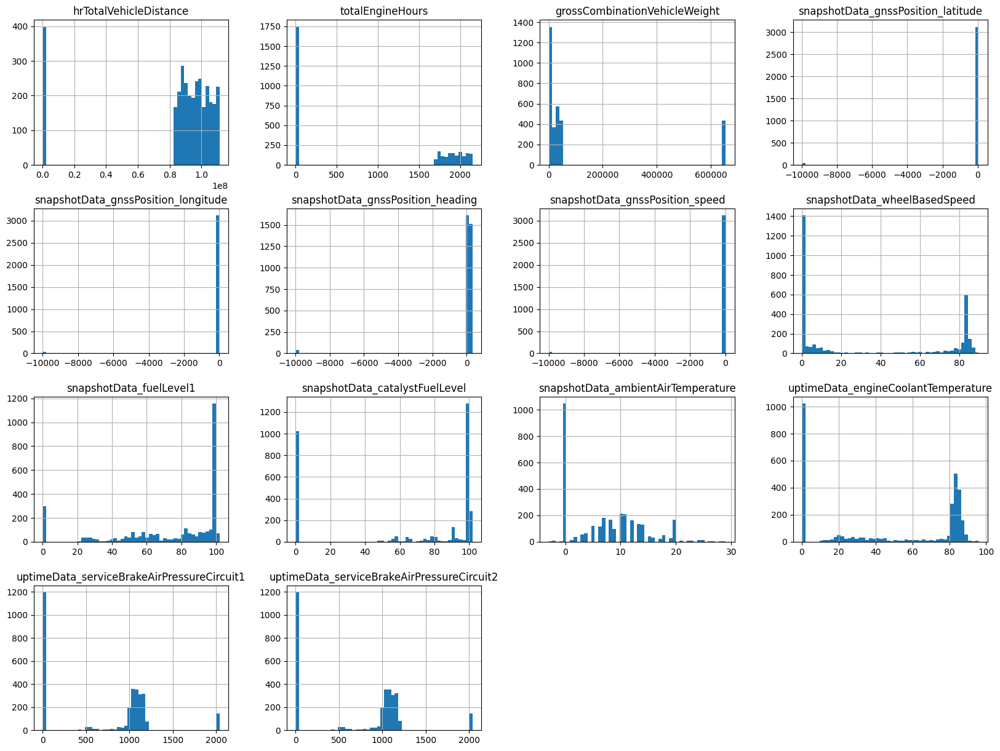

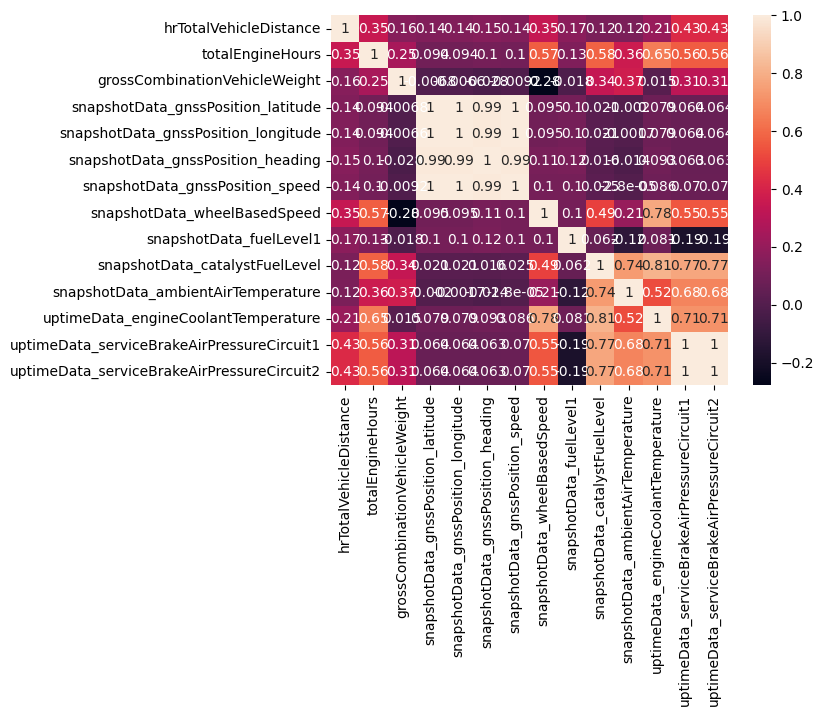

In [ ]:
# Select only the numerical columns
df_numerical = df_truck.select_dtypes(include=['int64', 'float64'])

# Check the first few rows of the numerical DataFrame
print(df_numerical.head())

# Check for missing values in the numerical DataFrame
print(df_numerical.isnull().sum())

# Calculate descriptive statistics for the numerical DataFrame
print(df_numerical.describe())

# Visualize the distribution of the numerical columns
df_numerical.hist(bins=50, figsize=(20,15))
plt.show()

# Visualize the correlation between the numerical columns
sns.heatmap(df_numerical.corr(), annot=True)
plt.show()


In [ ]:
# Create a box plot for the numerical columns
fig = px.box(df_numerical, orientation='v')
fig.show()

# Create a violin plot for the numerical columns
fig = px.violin(df_numerical, orientation='v')
fig.show()

# Create a scatter plot matrix for the numerical columns
fig = px.scatter_matrix(df_numerical)
fig.update_layout(autosize=False, width=1000, height=1000)
fig.show()

# Create a heatmap for the correlation matrix
fig = go.Figure(data=go.Heatmap(
    z=df_numerical.corr().values,
    x=df_numerical.columns,
    y=df_numerical.columns,
    colorbar=dict(title='Correlation')
))

fig.show()

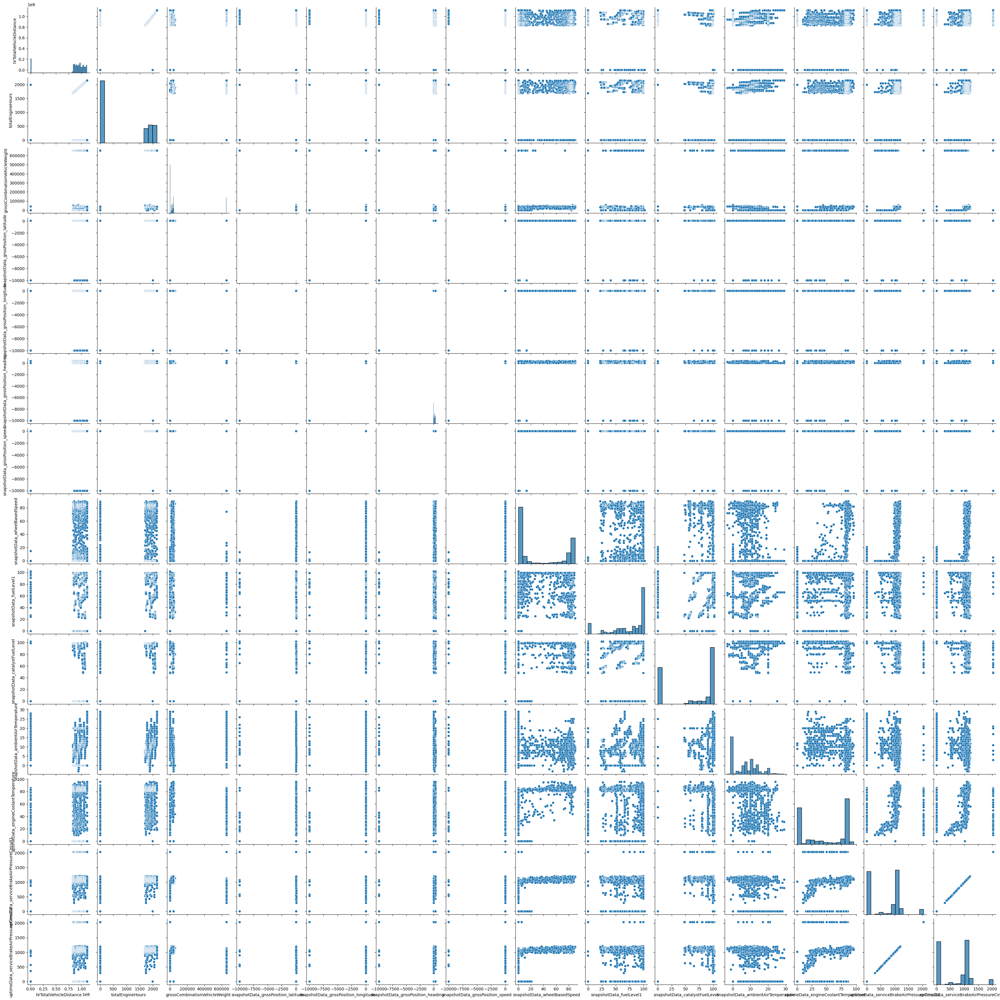

In [ ]:
sns.pairplot(df_numerical)
plt.show()

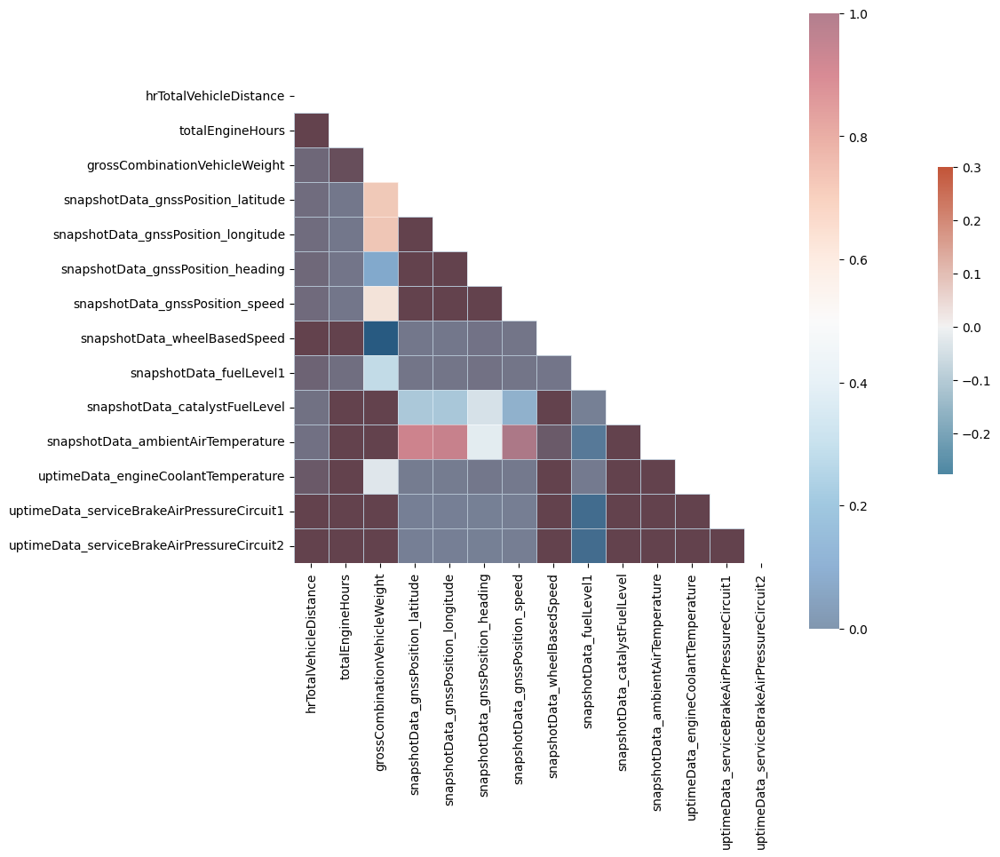

In [ ]:
def corr_with_significance(df):
    corr = df.corr()
    p_val = np.zeros_like(corr)
    for i in range(len(df.columns)):
        for j in range(i+1, len(df.columns)):
            p_val[i,j] = stats.pearsonr(df[df.columns[i]], df[df.columns[j]])[1]
            p_val[j,i] = p_val[i,j]
    return corr, p_val

corr, p_val = corr_with_significance(df_numerical)

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},
            xticklabels=df_numerical.columns, yticklabels=df_numerical.columns)

# Add significance levels
sns.heatmap(p_val, mask=mask, cmap='RdBu_r', vmin=0, vmax=1,
            square=True, linewidths=.5, alpha=.5,
            xticklabels=df_numerical.columns, yticklabels=df_numerical.columns)

plt.show()


In [ ]:
pca = PCA(n_components=2)
pca_results = pca.fit_transform(df_numerical)

fig = px.scatter(pca_results, x=0, y=1, labels={'x': 'PCA 1', 'y': 'PCA 2'})
fig.show()


In [ ]:
def outlier_detection(df):
    clf = EllipticEnvelope(contamination=.1)
    clf.fit(df)
    return df[clf.predict(df) == -1]

outliers = outlier_detection(df_numerical)

# Plot the data points
fig = px.scatter(df_numerical, x='hrTotalVehicleDistance', y='totalEngineHours')
fig.show()

# Highlight the outliers
fig = px.scatter(df_numerical, x='hrTotalVehicleDistance', y='totalEngineHours')
fig.add_scatter(x=outliers['hrTotalVehicleDistance'], y=outliers['totalEngineHours'], mode='markers',
                 marker=dict(color='red', size=10))
fig.show()


In [ ]:
def data_clustering(df, n_clusters):
    model = KMeans(n_clusters=n_clusters)
    model.fit(df)
    return model.labels_

labels = data_clustering(df_numerical, 3)

# Plot the data points and color them according to their cluster labels
fig = px.scatter(df_numerical, x='hrTotalVehicleDistance', y='totalEngineHours', color=labels)
fig.show()


In [ ]:
df_truck.to_pickle("../data/dummy.pkl")